<a href="https://colab.research.google.com/github/KFrimps/Self-Driving-Car/blob/main/Self_Driving_Car.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
#Loading data
datadir = '/content/drive/MyDrive/Colab Notebooks/Data - Self Driving Car'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data - Self Driving Car/driving_log.csv', names = columns)
pd.set_option('display.max_colwidth', 1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2024_07_19_22_24_44_949.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2024_07_19_22_24_44_949.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2024_07_19_22_24_44_949.jpg,0.0,0.0,0,0.000002
1,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2024_07_19_22_24_45_053.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2024_07_19_22_24_45_053.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2024_07_19_22_24_45_053.jpg,0.0,0.0,0,0.000011
2,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2024_07_19_22_24_45_156.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2024_07_19_22_24_45_156.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2024_07_19_22_24_45_156.jpg,0.0,0.0,0,0.000014
3,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2024_07_19_22_24_45_258.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2024_07_19_22_24_45_258.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2024_07_19_22_24_45_258.jpg,0.0,0.0,0,0.000012
4,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2024_07_19_22_24_45_368.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2024_07_19_22_24_45_368.jpg,D:\Self Driving Car 2\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2024_07_19_22_24_45_368.jpg,0.0,0.0,0,0.000008


In [ ]:
#Truncating data in columns center, left & right.
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_07_19_22_24_44_949.jpg,left_2024_07_19_22_24_44_949.jpg,right_2024_07_19_22_24_44_949.jpg,0.0,0.0,0,0.000002
1,center_2024_07_19_22_24_45_053.jpg,left_2024_07_19_22_24_45_053.jpg,right_2024_07_19_22_24_45_053.jpg,0.0,0.0,0,0.000011
2,center_2024_07_19_22_24_45_156.jpg,left_2024_07_19_22_24_45_156.jpg,right_2024_07_19_22_24_45_156.jpg,0.0,0.0,0,0.000014
3,center_2024_07_19_22_24_45_258.jpg,left_2024_07_19_22_24_45_258.jpg,right_2024_07_19_22_24_45_258.jpg,0.0,0.0,0,0.000012
4,center_2024_07_19_22_24_45_368.jpg,left_2024_07_19_22_24_45_368.jpg,right_2024_07_19_22_24_45_368.jpg,0.0,0.0,0,0.000008


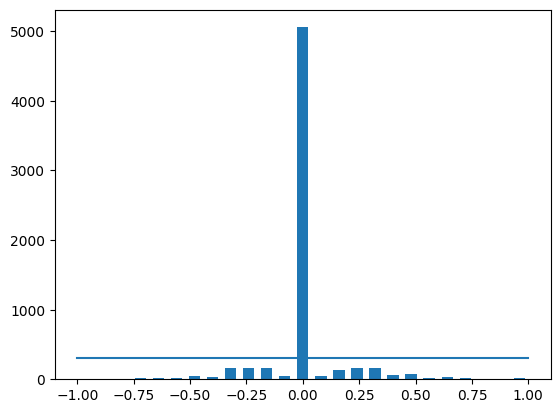

In [ ]:
#The zeros are a lot. To reduce bias towards the zeros, a threshold is for the zero is generated.
num_bins = 25
samples_per_bin = 300
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 6465
(6465, 7)


In [ ]:
#Remove excess zeros to have a balanced data
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 4758
remaining: 1707


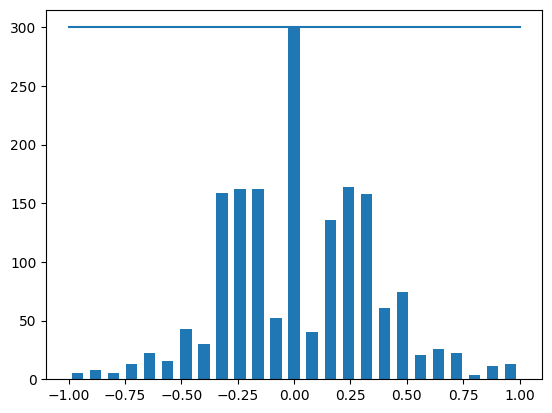

In [ ]:
# Visualizing after removing extra zeros
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [ ]:
image_paths
len(image_paths)

5121

In [ ]:
len(steerings)

5121

In [ ]:
#Splitting data into a training and validation set
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 4096
Valid Samples: 1025


Text(0.5, 1.0, 'Validation set')

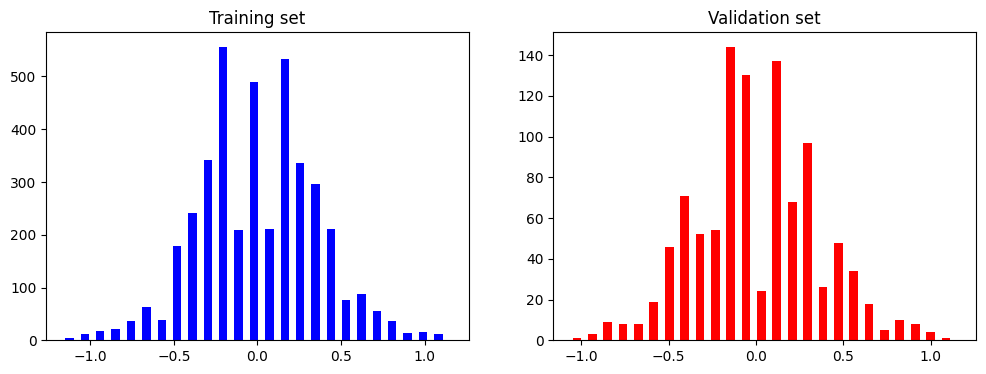

In [ ]:
#Visualizing how close the two datasets are
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

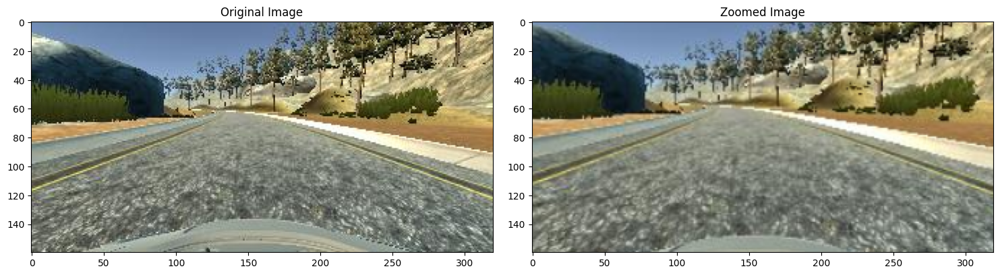

In [ ]:
#Zoom augmentation technique
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

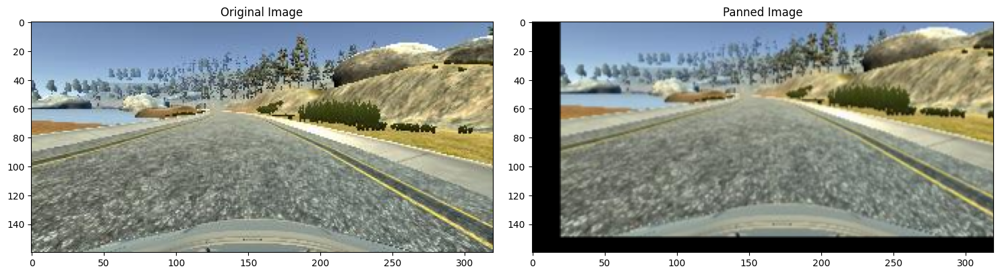

In [ ]:
# Pan augmentation technique
def pan(image):
  pan = iaa.Affine(translate_percent = {'x': (-0.1, 0.1), 'y': (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')


Text(0.5, 1.0, 'Brightness Altered Image')

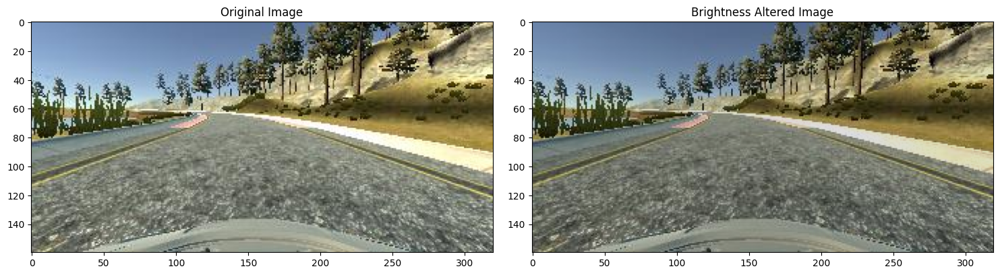

In [ ]:
# Brightness augmentation technique
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

Text(0.5, 1.0, 'Flipped Image- Steering Angle:0.3')

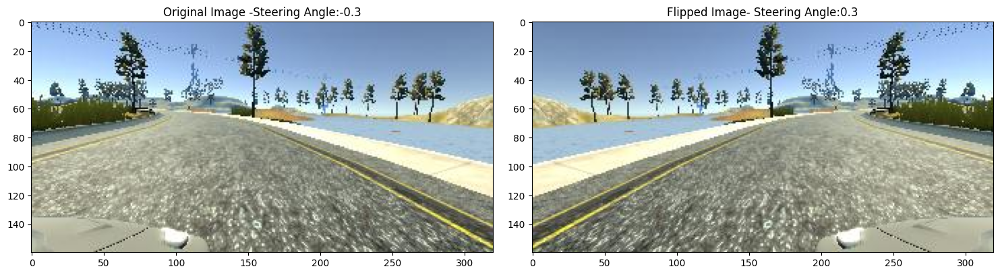

In [ ]:
#Flip augmentation technique
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)
  steering_angle = -steering_angle
  return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image -' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image- ' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
#Combining all the augmentation techniques
def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

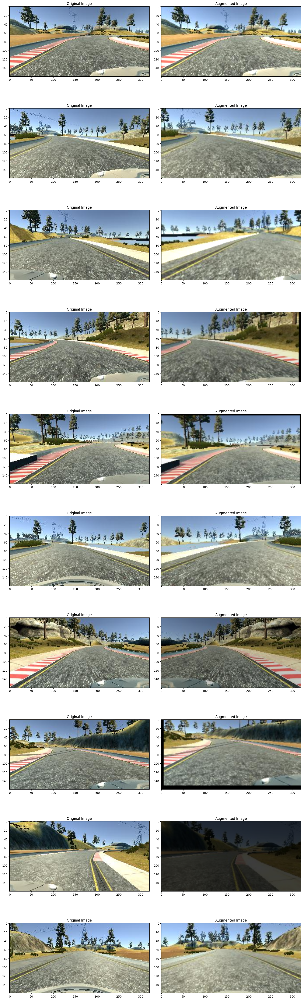

In [ ]:
# Applying the augmentation techniques to 10 random images
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('Augmented Image')

In [ ]:
def img_preprocess(img):
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

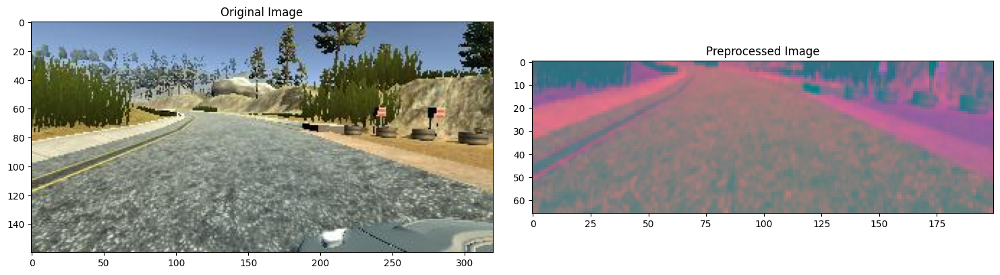

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
!nvidia-smi

Sun Jul 28 20:19:27 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))


In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_train_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

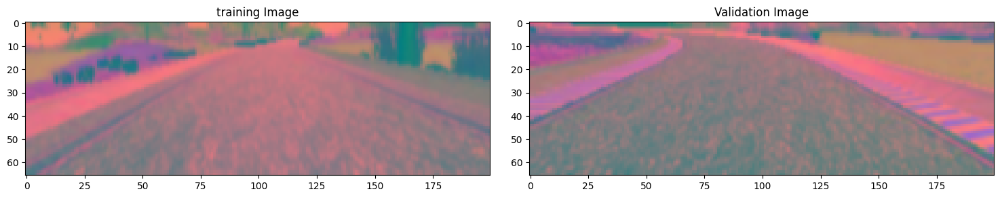

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))

  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))

  model.add(Dense(50, activation = 'elu'))

  model.add(Dense(10, activation = 'elu'))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss = 'mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle=1)

<ipython-input-29-47f952a5504d>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 2778s 9s/step - loss: 0.3593 - val_loss: 0.1354
Epoch 2/10
300/300 [==============================] - 256s 856ms/step - loss: 0.1141 - val_loss: 0.0997
Epoch 3/10
300/300 [==============================] - 258s 864ms/step - loss: 0.0848 - val_loss: 0.0697
Epoch 4/10
300/300 [==============================] - 312s 1s/step - loss: 0.0778 - val_loss: 0.0675
Epoch 5/10
300/300 [==============================] - 258s 863ms/step - loss: 0.0769 - val_loss: 0.0644
Epoch 6/10
300/300 [==============================] - 266s 888ms/step - loss: 0.0740 - val_loss: 0.0602
Epoch 7/10
300/300 [==============================] - 284s 951ms/step - loss: 0.0701 - val_loss: 0.0519
Epoch 8/10
300/300 [==============================] - 241s 807ms/step - loss: 0.0682 - val_loss: 0.0494
Epoch 9/10
300/300 [==============================] - 254s 851ms/step - loss: 0.0651 - val_loss: 0.0443
Epoch 10/10
300/300 [==============================] - ETA: 0s - loss

In [1]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('loss')
plt.xlabel('Epoch')

NameError: name 'plt' is not defined

In [2]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

NameError: name 'model' is not defined